# Plotly Basics


Plotly is an Open Source Graphing Library that allows us to make interactive charts and maps for Python, R, Julia, Javascript, MATLAB, and Dash. 

In this course we'll use the latest stable version 5.6.0


To install: 

```python
pip install plotly==5.6.0
```
or 
```python
conda install -c plotly plotly=5.6.0
```

This package contains everything you need to write figures to standalone HTML files.



> "Plotly Express is the easy-to-use, high-level interface to Plotly, which operates on a variety of types of data and produces easy-to-style figures."

In [1]:
import plotly.express as px

# Basic Charts

## Bar plot
----- 

Quickly let's create a bar chart in matplotlib...

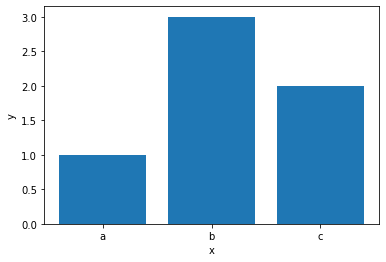

In [2]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.bar([1,2,3], [1,3,2])
ax.set_ylabel("y")
ax.set_xlabel("x")
ax.set_xticks([1,2,3])
_ = ax.set_xticklabels(['a', 'b', 'c'])

plt.show()
plt.close()

Let's do the same thing in Plotly! 

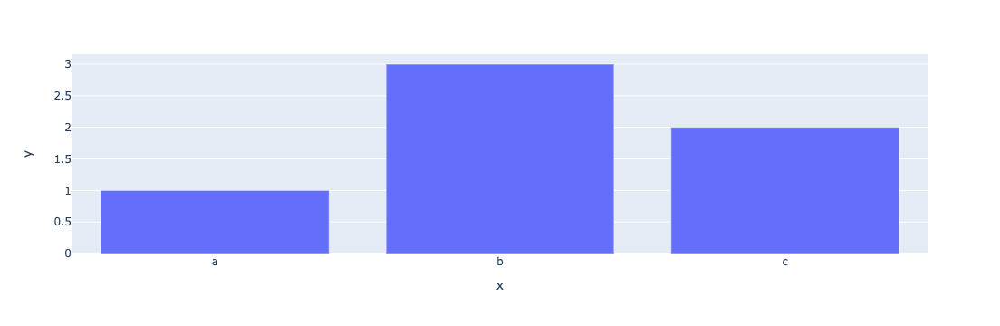

In [3]:
fig = px.bar(x=["a", "b", "c"], y=[1, 3, 2])
fig.show()

What is fig?

In [4]:
type(fig)

plotly.graph_objs._figure.Figure

## Exporting Graphs in plotly

On the backend Plotly uses HTML and javascript and abstracts that code from us. We can export this graph as an html file to view in any browser.

Use `write_html` function in any plotly Figure variable.
- the auto_open argument will open the webpage after creating it. 

In [5]:
fig.write_html('first_figure.html', auto_open=True)

## Using plotly with data 

We'll use the medal dataset, that contains the value counts of a medal category by nation

In [6]:
long_df = px.data.medals_long()  # This is a pandas dataframe

long_df

,nation,medal,count
0,South Korea,gold,24
1,China,gold,10
2,Canada,gold,9
3,South Korea,silver,13
4,China,silver,15
5,Canada,silver,12
6,South Korea,bronze,11
7,China,bronze,8
8,Canada,bronze,12


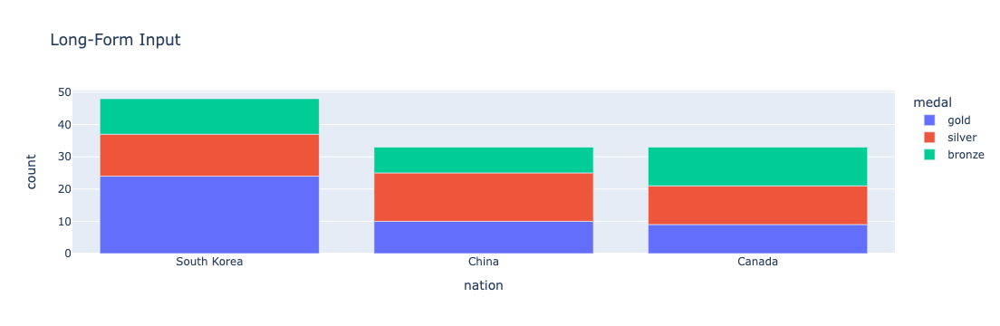

In [7]:
fig = px.bar(long_df, x="nation", y="count", color="medal", title="Long-Form Input")
fig.show()

## Scatter Plots

To generate scatter plots: 
```python
plotly.express.scatter
```


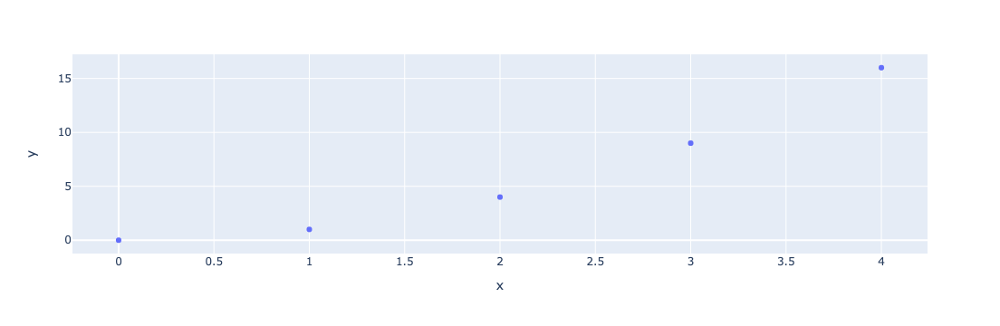

In [8]:
fig = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])

fig.show()

We can use data, similar to the bar plot example. 
Let's use the Iris data...

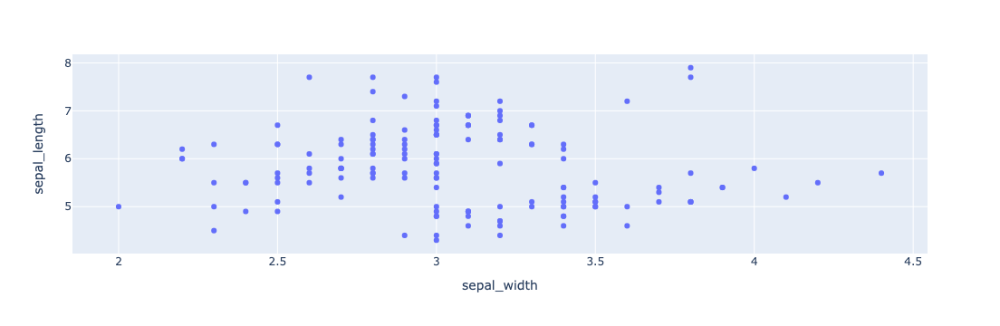

In [9]:
iris = px.data.iris() # iris is a pandas DataFrame...
fig = px.scatter(iris, x="sepal_width", y="sepal_length")
fig.show()

## Line Plots

To create Line Plots we can use: 
```python 
plotly.express.line()
```


Let's use [gapminder data](https://www.gapminder.org/about/)

In [10]:
df = px.data.gapminder()
df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [11]:
can_df = df.loc[df.country == 'Canada']
can_df

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
240,Canada,Americas,1952,68.750,14785584,11367.16112,CAN,124
241,Canada,Americas,1957,69.960,17010154,12489.95006,CAN,124
242,Canada,Americas,1962,71.300,18985849,13462.48555,CAN,124
243,Canada,Americas,1967,72.130,20819767,16076.58803,CAN,124
244,Canada,Americas,1972,72.880,22284500,18970.57086,CAN,124
245,Canada,Americas,1977,74.210,23796400,22090.88306,CAN,124
246,Canada,Americas,1982,75.760,25201900,22898.79214,CAN,124
247,Canada,Americas,1987,76.860,26549700,26626.51503,CAN,124
248,Canada,Americas,1992,77.950,28523502,26342.88426,CAN,124
249,Canada,Americas,1997,78.610,30305843,28954.92589,CAN,124


To create a line graph, 

```python
plotly.express.line
```

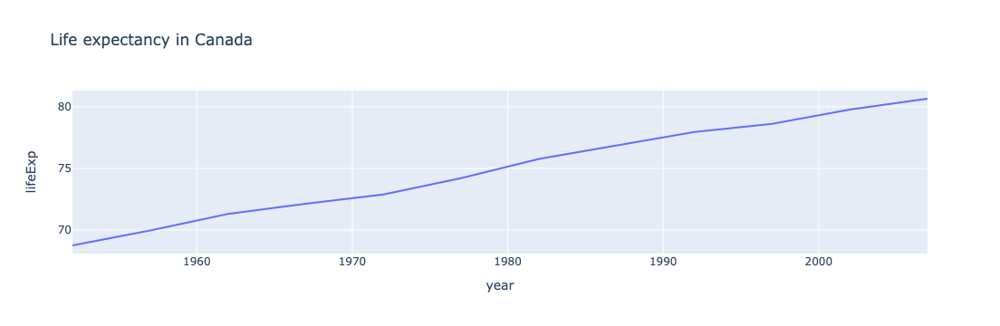

In [12]:
fig = px.line(can_df, x="year", y="lifeExp", title='Life expectancy in Canada')
fig.show()

### Encoding color based on a column

- Pass in column to encode the color

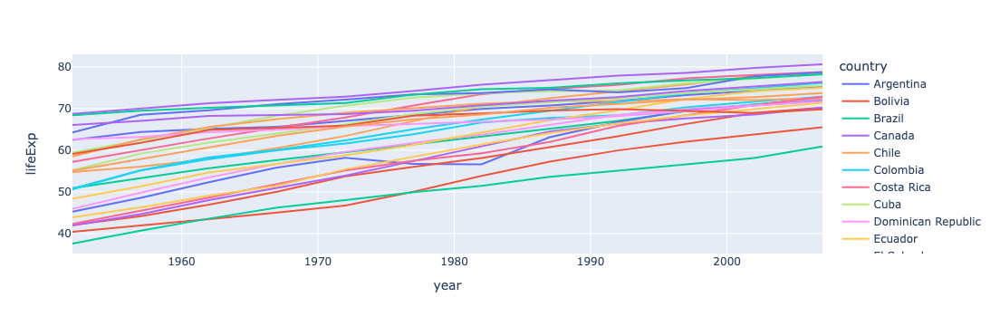

In [13]:
continent_df = df.loc[df.continent == "Americas"]

fig = px.line(continent_df, x="year", y="lifeExp", color='country')

fig.show()

### Error Bars


It's easy to plot error bars with Plotly Express.

Let's generate fake errors and display the expected errors of life  Expectancy

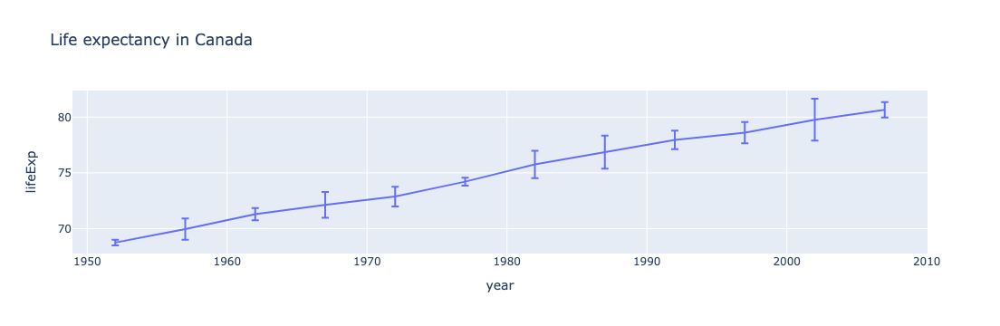

In [14]:
import numpy as np

fake_error = np.abs(np.random.normal(size=len(can_df)))

fig = px.line(can_df, x="year", y="lifeExp",
              title='Life expectancy in Canada',
              error_y=fake_error)
fig.show()

## Bubble Chart

We can embed a 3rd dimension into scatter plots shown through the size of markers 


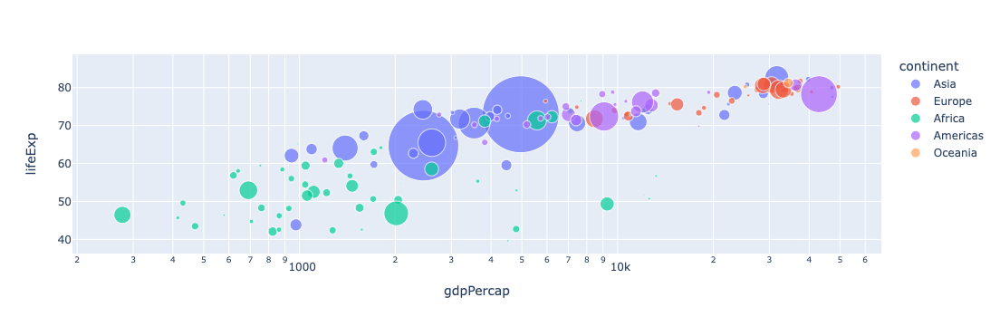

In [15]:
fig = px.scatter(df.loc[df.year == 2007], x="gdpPercap", y="lifeExp",
                 size="pop", color="continent",
                 hover_name="country", log_x=True, size_max=60)
fig.show()

For Finer control we can use graph objects to create plots

In [16]:
import plotly.graph_objects as go

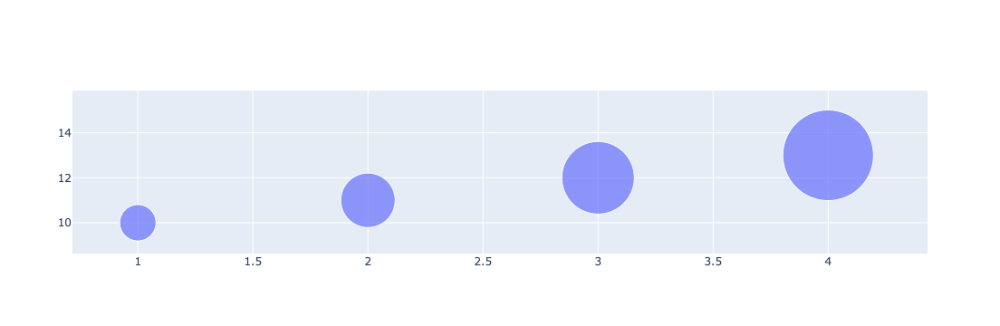

In [17]:
fig = go.Figure(
    data=[go.Scatter(x=[1, 2, 3, 4], y=[10, 11, 12, 13],
                     mode='markers',marker_size=[40, 60, 80, 100])]
)

fig.show()

### Recreate the Gapminds Bubble Chart with Graph Objects

In [18]:
import pandas as pd
import math

#### Format the data to visualize

In [19]:
df_2007 = df.loc[df.year == 2007]
df_2007 = df_2007.sort_values(['continent', 'country'])

hover_text = []  # will store information to display when we hover over a bubble
bubble_size = []  # will store the size of bubbles... 


# will iter over each row in the dataframe and get information about the country, 
# life expectancy etc. and store in a tuple and append to a list... 
# We take the sqrt of the population for the bubble size... 
for index, row in df_2007.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'Life Expectancy: {lifeExp}<br>'+
                      'GDP per capita: {gdp}<br>'+
                      'Population: {pop}<br>'+
                      'Year: {year}').format(country=row['country'],
                                            lifeExp=row['lifeExp'],
                                            gdp=row['gdpPercap'],
                                            pop=row['pop'],
                                            year=row['year']))
    bubble_size.append(math.sqrt(row['pop']))
    
    
df_2007['text'] = hover_text
df_2007['size'] = bubble_size
sizeref = 2.*max(df_2007['size'])/(100**2)

# Dictionary with dataframes for each continent
continent_names = ['Africa', 'Americas', 'Asia', 'Europe', 'Oceania']
continent_data = {continent:df_2007.query("continent == '%s'" %continent)
                              for continent in continent_names}


#### Create the Figure

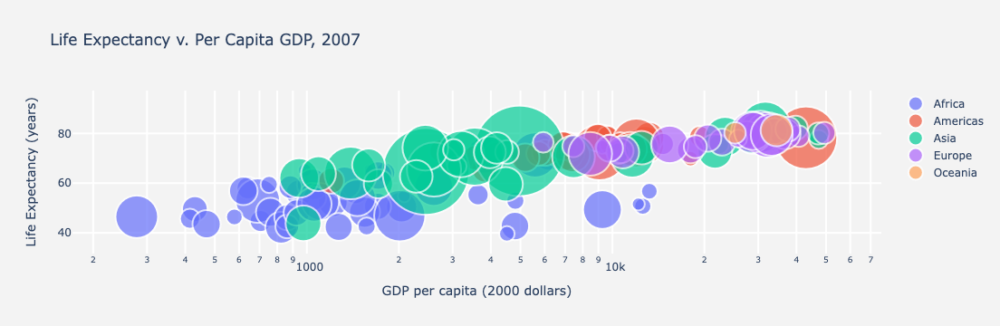

In [20]:
# Create figure
fig = go.Figure()

for continent_name, continent in continent_data.items():
    fig.add_trace(go.Scatter(
        x=continent['gdpPercap'], y=continent['lifeExp'],
        name=continent_name, text=continent['text'],
        marker_size=continent['size'],
        ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

fig.update_layout(
    title='Life Expectancy v. Per Capita GDP, 2007',
    xaxis=dict(
        title='GDP per capita (2000 dollars)',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='Life Expectancy (years)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)
fig.show()

## Histograms

In [21]:
tips = px.data.tips()
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


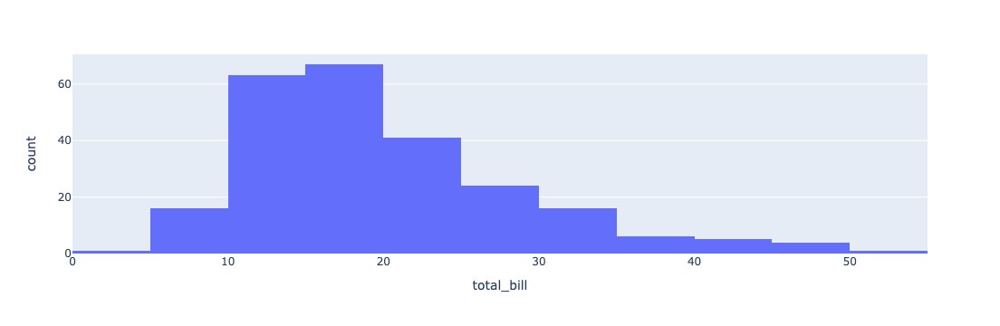

In [22]:
fig = px.histogram(tips, x="total_bill", nbins=20)
fig.show()

### Histograms on Categorical Data

Will automatically bin categorical data as well

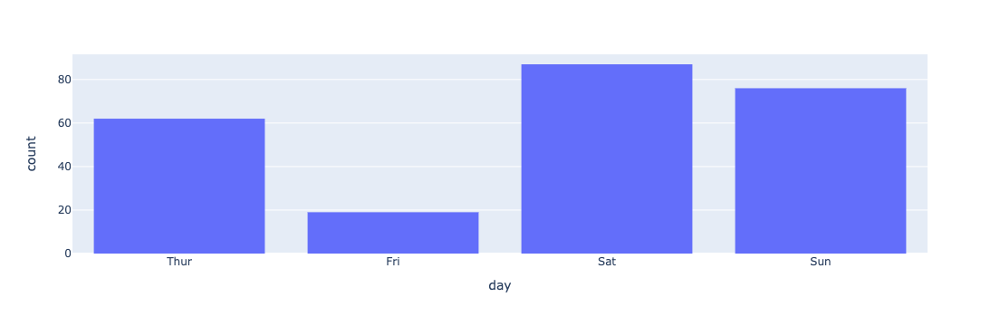

In [23]:
fig = px.histogram(tips, x="day", category_orders=dict(day=["Thur", "Fri", "Sat", "Sun"]))
fig.show()

### Histograms on Date Data

Ploylt histograms also automatically bin dates too

In [24]:
stocks = px.data.stocks()
stocks.date = pd.to_datetime(stocks.date)
print("dtype of date:", stocks.date.dtype)
stocks

dtype of date: datetime64[ns]


,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708
...,...,...,...,...,...,...,...
100,2019-12-02,1.216280,1.546914,1.425061,1.075997,1.463641,1.720717
101,2019-12-09,1.222821,1.572286,1.432660,1.038855,1.421496,1.752239
102,2019-12-16,1.224418,1.596800,1.453455,1.104094,1.604362,1.784896
103,2019-12-23,1.226504,1.656000,1.521226,1.113728,1.567170,1.802472


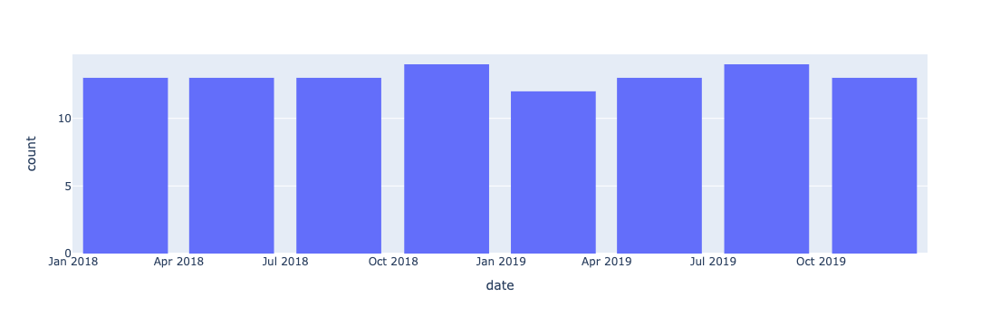

In [25]:
fig = px.histogram(stocks, x="date")
fig.update_layout(bargap=0.2)
fig.show()

## Box Plots

A box plot is a statistical representation of the distribution of a variable through its quartiles. The ends of the box represent the lower and upper quartiles, while the median (second quartile) is marked by a line inside the box.

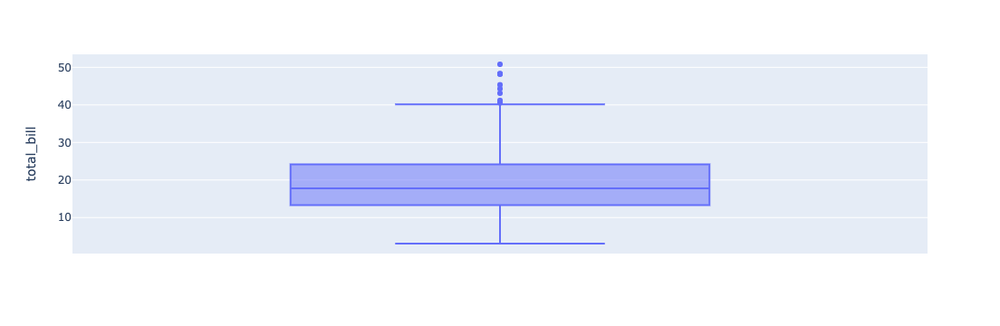

In [26]:
fig = px.box(tips, y="total_bill")
fig.show()

### Combined representations of graphs

Several representations of statistical distributions are available in plotly, such as histograms, violin plots, box plots 


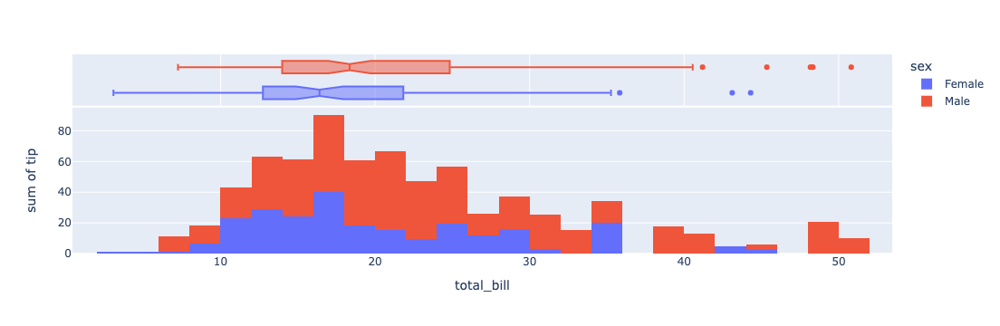

In [27]:
fig = px.histogram(tips, x="total_bill", y="tip", color="sex",
                   marginal="box", # or violin, rug
                   hover_data=tips.columns)
fig.show()

## Interactive Geospatial Plots


To visualize geospatial data we need:

1. GeoJSON-formatted geometry information where each feature has either an id field or some identifying value in properties.
1. A list of values indexed by feature identifier.


Let's look at GeoJSON

In [28]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

counties["features"][0]

{'type': 'Feature',
 'properties': {'GEO_ID': '0500000US01001',
  'STATE': '01',
  'COUNTY': '001',
  'NAME': 'Autauga',
  'LSAD': 'County',
  'CENSUSAREA': 594.436},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-86.496774, 32.344437],
    [-86.717897, 32.402814],
    [-86.814912, 32.340803],
    [-86.890581, 32.502974],
    [-86.917595, 32.664169],
    [-86.71339, 32.661732],
    [-86.714219, 32.705694],
    [-86.413116, 32.707386],
    [-86.411172, 32.409937],
    [-86.496774, 32.344437]]]},
 'id': '01001'}

Feature.id is the [FIPS code](https://en.wikipedia.org/wiki/FIPS_county_code) in this case

----

Let's read in unemployment data

In [29]:
df_unemp = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})
df_unemp.head()

,fips,unemp
0,01001,5.3
1,01003,5.4
2,01005,8.6
3,01007,6.6
4,01009,5.5


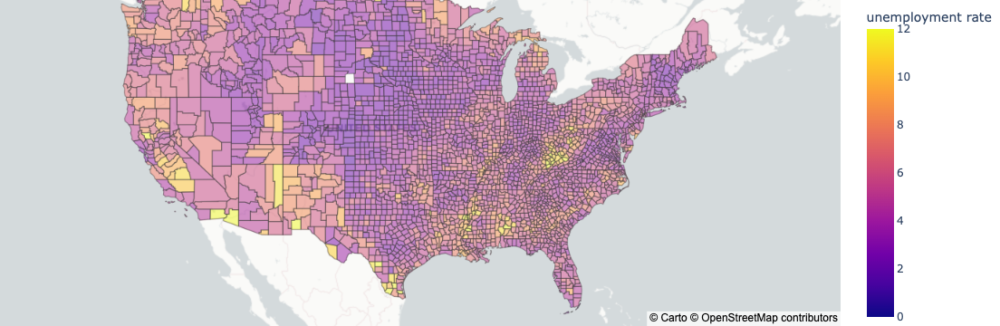

In [30]:
fig = px.choropleth_mapbox(df_unemp, geojson=counties, locations='fips', color='unemp',
                           #color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           labels={'unemp':'unemployment rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Dash

Dash is built on top of Plotly and React. Is ideal for building and deploying data driven apps with customizable user interfaces. 

With simple software design patterns it is able to abstract away all of front-end and back-end technologies and protocols required to build a full-stack app

----

To install dash:

```python
pip install dash==2.1.0
```

To use dash in a jupyter notebook:
```python
pip install jupyter-dash
```


To see the capabilities run `DashApps/1-HelloDash.py`

This is the tip of the iceburg. There's a lot more more capabilities in Plotly.  The offical documentation has many examples to explore...

More Resources:
- Plotly tutorial: https://www.youtube.com/watch?v=GGL6U0k8WYA 
- Dash Reference:  https://dash.plotly.com/ 

[Reference](https://plotly.com/python/)